### Prep

In [96]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon, MultiPolygon
from geoalchemy2 import Geometry, WKTElement
import matplotlib.pyplot as plt
import numpy as np


In [97]:
from sqlalchemy import create_engine
import psycopg2
import psycopg2.extras
import json

credentials = "Credentials.json"

def pgconnect(credential_filepath, db_schema="public"):
    with open(credential_filepath) as f:
        db_conn_dict = json.load(f)
        host = db_conn_dict['host']
        db_user = db_conn_dict['user']
        db_pw = db_conn_dict['password']
        default_db = db_conn_dict['user']
        try:
            db = create_engine('postgresql+psycopg2://'+db_user +
                               ':'+db_pw+'@'+host+'/'+default_db, echo=False)
            conn = db.connect()
            print('Connected successfully.')
        except Exception as e:
            print("Unable to connect to the database.")
            print(e)
            db, conn = None, None
        return db, conn


In [98]:
db, conn = pgconnect(credentials)

Connected successfully.


In [99]:
def query(conn, sqlcmd, args=None, df=True):
    result = pd.DataFrame() if df else None
    try:
        if df:
            result = pd.read_sql_query(sqlcmd, conn, params=args)
        else:
            result = conn.execute(sqlcmd, args).fetchall()
            result = result[0] if len(result) == 1 else result
    except Exception as e:
        print("Error encountered: ", e, sep='\n')
    return result

In [100]:
# The official coordinate system for Australia is GDA94
srid = 4283
def create_wkt_element(geom, srid):
    if geom.geom_type == 'Polygon':
        geom = MultiPolygon([geom])
    return WKTElement(geom.wkt, srid)

### 1. Dataset Cleaning and Populate to Database

#### 1.1 SA2

In [84]:
SA2 = gpd.read_file("SA2_2016_AUST/SA2_2016_AUST.shp")
SA2 = SA2[['SA2_MAIN16','SA2_NAME16','SA3_NAME16','GCC_NAME16','geometry']]
SA2.columns = map(str.lower, SA2.columns)
# drop geometry is None
nullrows = SA2.loc[SA2.isnull().any(axis=1)]
SA2.drop(nullrows.index, inplace=True)
# placeholder checked


In [85]:
SA2['geom'] = SA2['geometry'].apply(lambda x: create_wkt_element(geom=x,srid=srid))  # applying the function
SA2 = SA2.drop(columns="geometry")  # deleting the old copy

In [88]:
# table name, column names all lowercase
# sa2_main16 REFERENCES Neighbourhoods(area_id)
conn.execute("""
DROP TABLE IF EXISTS sa2;
CREATE TABLE sa2 (
    sa2_main16 VARCHAR(10) PRIMARY KEY,
    sa2_name16 VARCHAR(50),
    sa3_name16 VARCHAR(50),
    gcc_name16 VARCHAR(28),
    geom GEOMETRY(MULTIPOLYGON,4283)
);

CREATE INDEX sa2_geom_idx 
    ON sa2
    USING GIST (geom);

""")
# http://postgis.net/workshops/postgis-intro/indexing.html

SA2.to_sql('sa2', conn, if_exists='append', index=False, dtype={'geom': Geometry('MULTIPOLYGON', srid)})
query(conn, "select * from sa2 LIMIT 3")


,sa2_main16,sa2_name16,sa3_name16,gcc_name16,geom
0,101021007,Braidwood,Queanbeyan,Rest of NSW,0106000020BB100000010000000103000000010000005F...
1,101021008,Karabar,Queanbeyan,Rest of NSW,0106000020BB100000010000000103000000010000002C...
2,101041018,Batemans Bay - South,South Coast,Rest of NSW,0106000020BB100000070000000103000000010000001C...


#### 1.2 School

School = PrimarySchool + SecondarySchool + FutureSchool

PRIORITY is None or N does not matter.
CATCH_TYPE, ADD_DATE, which year do not matter

No none data after dropping add_date
(temp = PrimarySchool.drop('add_date', axis=1)
temp.loc[temp.isnull().any(axis=1))

In [59]:
PrimarySchool = gpd.read_file("school_catchments/catchments_primary.shp")
PrimarySchool.rename(columns={'USE_ID': 'school_id', 'USE_DESC': 'school_name', 'CATCH_TYPE':'type'}, inplace=True)
PrimarySchool = PrimarySchool[['school_id','school_name','type', 'geometry']]

SecondarySchool = gpd.read_file("school_catchments/catchments_secondary.shp")
SecondarySchool.rename(columns={'USE_ID': 'school_id', 'USE_DESC': 'school_name'}, inplace=True)
SecondarySchool = SecondarySchool[['school_id','school_name','geometry']]

FutureSchool = gpd.read_file("school_catchments/catchments_future.shp")
FutureSchool.rename(columns={'USE_ID': 'school_id', 'USE_DESC': 'school_name', 'CATCH_TYPE':'type'}, inplace=True)
FutureSchool = FutureSchool[['school_id','school_name','type','geometry']]

School = pd.concat([PrimarySchool,SecondarySchool,FutureSchool], axis=0)

# 102 schools appear in both future and primary or secondary school, just drop
School.drop_duplicates(subset=['school_id'], inplace=True, ignore_index=True)


In [60]:
School['geom'] = School['geometry'].apply(lambda x: create_wkt_element(geom=x,srid=srid))
School = School.drop(columns="geometry")

In [61]:
# School['type'].str.len().max()
conn.execute("""
DROP TABLE IF EXISTS school;
CREATE TABLE school (
    school_id CHAR(4) PRIMARY KEY,
    school_name VARCHAR(36),
    type VARCHAR(15),
    geom GEOMETRY(MULTIPOLYGON,4283)
);

CREATE INDEX school_geom_idx 
    ON school
    USING GIST (geom);
    
""")

School.to_sql("school", conn, if_exists='append', index=False, dtype={'geom': Geometry('MULTIPOLYGON', srid)})
query(conn, "select * from school LIMIT 3")


,school_id,school_name,type,geom
0,2838,Parklea PS,PRIMARY,0106000020BB1000000100000001030000000100000078...
1,3943,Gordon WPS,PRIMARY,0106000020BB100000010000000103000000010000006F...
2,2404,Lindfield EPS,PRIMARY,0106000020BB10000001000000010300000001000000BE...


#### 1.3 Swimmingpool

In [77]:
# https://data.cityofsydney.nsw.gov.au/datasets/cityofsydney::swimming-pools/about GeoJSON data
url = 'https://services1.arcgis.com/cNVyNtjGVZybOQWZ/arcgis/rest/services/SwimmingPools/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson'
Swimmingpool = gpd.read_file(url)
Swimmingpool.drop(['OBJECTID','Class','Address','Address2','PhoneNumber','URL','Postcode'],axis=1,inplace=True)
Swimmingpool.columns = map(str.lower, Swimmingpool.columns)
Swimmingpool = Swimmingpool.rename_geometry('geom')
Swimmingpool.to_crs(crs="EPSG:4283", inplace=True)


In [80]:
conn.execute("""
DROP TABLE IF EXISTS swimmingpool;
CREATE TABLE swimmingpool (
    name VARCHAR(42) PRIMARY KEY, 
    suburb VARCHAR(11), 
    details VARCHAR(12),
    geom GEOMETRY(POINT,4283)
);"""
)

Swimmingpool.to_postgis('swimmingpool', conn, if_exists='append', index=False, dtype={'geom': Geometry('POINT', srid)})
query(conn, "select * from swimmingpool LIMIT 3")


,name,suburb,details,geom
0,The Andrew (Boy) Charlton Pool,Sydney,Outdoor Pool,0101000020BB1000009BA9798C1BE762401DC4B9097DEE...
1,Cook+Phillip Park Aquatic & Fitness Centre,Sydney,Indoor Pool,0101000020BB100000B3A0F187D1E66240922D8AACBEEF...
2,Victoria Park Pool,Camperdown,Outdoor Pool,0101000020BB1000003E45A45227E66240726CA62C6DF1...


#### 1.4 Neighbourhoods

Removed all the rows where their average monthly rent is empty. As by observing the dataset, areas that has no records for average monthly rent are areas that don't have houses to live in or land to build houses ( industry area, airport..) During this data cleaning, all columns names that started or end with a name have been removed to the alphabete version of the upper bound of the number such that PosgreSQL don't catch any error when querying.

In [103]:
neighbour = pd.read_csv('Neighbourhoods.csv')
neighbour.dropna(subset = ['avg_monthly_rent'], inplace = True)
neighbour.dropna(subset = ['median_annual_household_income'], inplace = True)
neighbour = neighbour.iloc[:, 1:]
neighbour.rename(columns = {
    'number_of_dwellings' : 'dwellings',
    'number_of_businesses' : 'businesses',
    'median_annual_household_income' : 'income',
    'avg_monthly_rent' : 'rent',
    '0-4' : 'four',
    '5-9' : 'nine',
    '10-14' : 'fourteen',
    '15-19' : 'nineteen'
    }, inplace = True)
neighbour['population'] = neighbour['population'].str.replace(',', '')
neighbour['dwellings'] = neighbour['dwellings'].str.replace(',', '')
neighbour['young'] = neighbour['four'] + neighbour['nine'] + neighbour['fourteen'] + neighbour['nineteen']

neighbourhoods = neighbour.copy()
neighbourhoods = neighbourhoods[['area_id','area_name','population','young','income','rent']]
neighbourhoods['area_id'] = neighbourhoods['area_id'].astype(str)


Area_id was made the primary key as it is unique for each row and is able to use to identify the reigion. data such as land_area, income and rent are set to be -1.0 if they are null, which can be easily spot and removed for later (as they cannot be 0) other integer data have default as 0 for null values.

In [106]:
# set all null values to -1 for better cleaning 
conn.execute("""
DROP TABLE IF EXISTS neighbourhoods;
CREATE TABLE neighbourhoods(
    area_id VARCHAR(10) PRIMARY KEY REFERENCES sa2(sa2_main16), 
    area_name VARCHAR(50),
    population INTEGER default 0,
    young INTEGER default 0,
    income FLOAT default -1.0,
    rent FLOAT default -1.0
);
""")

neighbourhoods.to_sql("neighbourhoods", con=conn, if_exists='append', index = False)
query(conn, 'select * from neighbourhoods limit 3')

,area_id,area_name,population,young,income,rent
0,102011028,Avoca Beach - Copacabana,7590,2214,46996.0,1906.0
1,102011029,Box Head - MacMasters Beach,10986,2635,42621.0,1682.0
2,102011030,Calga - Kulnura,4841,1098,42105.0,1182.0


#### 1.5 Business

The provided business data shows a wider range across Australia, while this report will focus solely on the area in Greater Sydney. As a result, it is resonable to filter the business data down to areas in Sydney that have data on the avarage renting Column names have been renamed to a single word for easier reference in query.

In [53]:
bus = pd.read_csv('BusinessStats.csv')
bus = bus[bus['area_id'].isin(neighbour['area_id'])]
bus.rename(columns = {
    'number_of_businesses' : 'bus_num',
    'accommodation_and_food_services' : 'food',
    'retail_trade' : 'retail',
    'agriculture_forestry_and_fishing' : 'agri',
    'health_care_and_social_assistance' : 'health',
    'public_administration_and_safety' : 'safty',
    'transport_postal_and_warehousing' : 'warehousing'
}, inplace = True)
bus['area_id'] = bus['area_id'].astype(str)
business = bus[['area_id','area_name','food','retail','health']]

Since the database include count of businesses of different industries, all of them should be integers.

In [107]:
# if no record, default is 0, business neglagible 
conn.execute("""
DROP TABLE IF EXISTS business;
CREATE TABLE business(
    area_id VARCHAR(10) PRIMARY KEY REFERENCES neighbourhoods(area_id),
    area_name VARCHAR(60),
    food INTEGER,
    retail INTEGER,
    health INTEGER
);
""")

business.to_sql("business", con=conn, if_exists='append', index = False)
query(conn, 'select * from business limit 3')

,area_id,area_name,food,retail,health
0,101051540,Goulburn Region,38,52,33
1,102011028,Avoca Beach - Copacabana,33,35,60
2,102011029,Box Head - MacMasters Beach,23,45,43


#### 1.6 Break and Enter (Theft)

By changing any polygon to multipolygon, consistency in data type will be maintained. While it is also a safe operation as polygons are subset of multipolygon and one can safely be a subset just conatinibg itself.

In [47]:
theft = gpd.read_file('break_and_enter/BreakEnterDwelling_JanToDec2021.shp')
theft.rename(columns = {'OBJECTID' : 'id'}, inplace = True)
theft = theft[['id','geometry']]
theft['id'] = theft['id'].astype(str)


In [31]:
theft['geom'] = theft["geometry"].apply(lambda x : create_wkt_element(geom = x, srid = srid) )
theft = theft.drop(columns = 'geometry')


In [32]:
conn.execute("""
DROP TABLE IF EXISTS theft;
CREATE TABLE theft (
    id VARCHAR(4) PRIMARY KEY,
    geom GEOMETRY(MULTIPOLYGON, 4283)
);
""")

theft.to_sql("theft", con=conn, if_exists='append', index = False, dtype={'geom': Geometry('POINT', srid)})
query(conn, 'select * from theft limit 3')


,id,geom
0,1,0106000020BB1000000100000001030000000100000015...
1,2,0106000020BB100000010000000103000000010000001D...
2,3,0106000020BB1000000100000001030000000100000007...


#### 1.7 Playgrounds

In [33]:
playgrounds = gpd.read_file('Playgrounds.geojson')

playgrounds.columns = playgrounds.columns.str.lower()
playgrounds = playgrounds.rename_geometry('geom')
playgrounds.to_crs(crs="EPSG:4283", inplace=True)
playgrounds = playgrounds[['objectid','name','type','geom']]
playgrounds['objectid'] = playgrounds['objectid'].astype(str)

In [39]:
conn.execute("""
DROP TABLE IF EXISTS playgrounds CASCADE;
CREATE TABLE playgrounds
(
    objectid VARCHAR(4) PRIMARY KEY,
    name VARCHAR(54) NOT NULL,
    type VARCHAR(15) NOT NULL,
    geom geometry(POINT, 4283) NOT NULL
);
""")

playgrounds.to_postgis("playgrounds", con=conn, if_exists='append', index = False, dtype={'geom': Geometry('POINT', srid)})

query(conn, "select * from playgrounds limit 3")


,objectid,name,type,geom
0,1,McKell Playground B,Playground,0101000020BB10000077B7218E4BE66240BFDAA90529F3...
1,2,Minogue Crescent Reserve Playground,Playground,0101000020BB100000375FB6D8A8E56240603C213FB1F0...
2,3,May Pitt Playground,Playground,0101000020BB100000CE77012AD0E56240EAD9784824F1...


#### 1.8 Fountains

In [47]:
fountains = gpd.read_file('DrinkingFountains.geojson')

fountains.columns = fountains.columns.str.lower()
fountains = fountains.rename_geometry('geom')
fountains.to_crs(crs="EPSG:4283", inplace=True)
fountains = fountains[['objectid','site_name','geom']]
fountains['objectid'] = fountains['objectid'].astype(str)

In [48]:
conn.execute("""
DROP TABLE IF EXISTS fountains CASCADE;
CREATE TABLE fountains
(
    objectid VARCHAR(3) PRIMARY KEY,
    site_name VARCHAR(255) NOT NULL,
    geom geometry(POINT, 4283) NOT NULL
)
""")

fountains.to_postgis("fountains", con=conn, if_exists='append', index = False, dtype={'geom': Geometry('POINT', srid)})

query(conn, "select * from fountains limit 3")


,objectid,site_name,geom
0,1,WJ Thurbon Playground,0101000020BB1000007497EE51D2E562404744C3F3A6F2...
1,2,M J (Paddy) Dougherty Reserve,0101000020BB1000002E7FA11B28E66240B7AC70578EF0...
2,3,St James Park,0101000020BB1000008413361DE9E562408ABD184CA3F0...


### 2. Greater Sydney Liveability Analysis

#### Z score

for all residential neighbourhoods 309

School z score

In [108]:
sql = """
WITH 
GeomNBHD AS (
    SELECT area_id, sa2.geom
    FROM neighbourhoods LEFT JOIN sa2 ON (sa2.sa2_main16 = neighbourhoods.area_id)
), 
    
schoolnum AS (
    SELECT GeomNBHD.area_id, COUNT(school.school_id) AS school_num
    FROM GeomNBHD LEFT JOIN school ON ST_Intersects(GeomNBHD.geom, school.geom)
    GROUP BY GeomNBHD.area_id ),

schoolScore AS (
    SELECT neighbourhoods.area_id,
        CASE
            WHEN neighbourhoods.young = 0 THEN 0
            ELSE school_num::decimal / young * 1000
        END school_score
    FROM neighbourhoods JOIN schoolnum USING(area_id) )


SELECT area_id, 
    (school_score - (SELECT AVG(school_score) FROM schoolScore)) / (SELECT STDDEV(school_score) FROM schoolScore) AS school_zscore
FROM schoolScore

"""
SchoolZScore = query(conn, sql)


Business

In [109]:
q = """
WITH
food_stat AS (
    select b.area_id as id, b.area_name as name, b.food, n.population, round(cast( b.food as decimal) /cast(n.population as decimal) * 1000,3) as per1000
    from business b join neighbourhoods n on (b.area_id = n.area_id) ),

retail_stat AS (
    select b.area_id as id, b.area_name as name, b.retail, n.population, round(cast( b.retail as decimal) /cast(n.population as decimal) * 1000,3) as retailPer1000
    from business b join neighbourhoods n on (b.area_id = n.area_id) ),
    
stat AS (
    select b.area_id as id, b.area_name as name, round(cast( b.retail as decimal) /cast(n.population as decimal) * 1000,3) as retailPer1000,
        round(cast( b.food as decimal) /cast(n.population as decimal) * 1000,3) as foodPer1000,
        round(cast( b.health as decimal) /cast(n.population as decimal) * 1000,3) as healthPer1000
    from business b join neighbourhoods n on (b.area_id = n.area_id) ),

nums AS (
    select avg(foodper1000) as foodmean,
         stddev(foodper1000) as foodsd,
         avg(retailper1000) as retailmean,
         stddev(retailper1000) as retailsd,
         avg(healthper1000) as healthmean,
         stddev(healthper1000) as healthsd
    from stat)
    
    
select b.area_id, b.area_name, 
    (foodper1000 - nums.foodmean) / nums.foodsd as food_zscore,
    (retailper1000 - nums.retailmean) / nums.retailsd as retail_zscore,
    (healthper1000 - nums.healthmean) / nums.healthsd as health_zscore
from stat f join business b on (b.area_id = f.id), nums; 

"""
BusZScore = pd.read_sql_query(q, conn)


Theft

In [110]:
q = """
WITH 
crimes AS (
    select b.area_id, b.area_name, a.crime from neighbourhoods b left join  
    (select n.area_id, n.area_name, sum(ST_Area(t.geom))/ST_Area(s.geom) as crime
    from neighbourhoods n left join sa2 s on (n.area_id = s.sa2_main16), theft t
    where ST_Contains(s.geom, t.geom)
    group by area_id, area_name, s.geom
    order by crime desc) a on (b.area_id = a.area_id)),

temp AS (
    select area_id, area_name, COALESCE(crime, 0) as crimes 
    from crimes),

data AS (
    select avg(crimes) as avg,
    stddev(crimes) as sd
    from temp )


select area_id, area_name, (crimes - avg)/sd as crime_zscore
from temp,data;

"""
CrimeZScore = pd.read_sql_query(q, conn)


#### Liveability Score

In [111]:
def sigmoid(x):
    sig = np.where(x < 0, np.exp(x)/(1 + np.exp(x)), 1/(1 + np.exp(-x)))
    return sig


In [112]:
# Liveability score for 309 residential neighbourhood
Score = pd.merge(SchoolZScore, BusZScore, how='outer', left_on='area_id', right_on='area_id')
Score = pd.merge(Score, CrimeZScore, how='outer', left_on='area_id', right_on='area_id')
Score['score'] = Score['school_zscore'] + Score['food_zscore'] + Score['retail_zscore'] - Score['crime_zscore'] + Score['health_zscore']

Score['SigmoidScore'] = sigmoid(Score['score'])
Score = Score[['area_id', 'SigmoidScore']]


In [113]:
SA = gpd.read_file("SA2_2016_AUST/SA2_2016_AUST.shp")

In [114]:
# Liveability score for all neighbourhoods in Greater Sydney
GS = SA.loc[SA['GCC_NAME16'] == 'Greater Sydney']
GSLiveability = pd.merge(GS, Score, how='left', left_on='SA2_MAIN16', right_on='area_id')
GSLiveability = GSLiveability[['SA2_MAIN16', 'SA2_NAME16', 'GCC_NAME16', 'SigmoidScore', 'geometry']]
# Non residential area scores are set to 0
GSLiveability.loc[GSLiveability['SigmoidScore'].isnull(), 'SigmoidScore'] = 0
GSLiveability


,SA2_MAIN16,SA2_NAME16,GCC_NAME16,SigmoidScore,geometry
0,102011028,Avoca Beach - Copacabana,Greater Sydney,0.698094,"POLYGON ((151.41373 -33.46559, 151.41361 -33.4..."
1,102011029,Box Head - MacMasters Beach,Greater Sydney,0.327298,"POLYGON ((151.35398 -33.49854, 151.35397 -33.4..."
2,102011030,Calga - Kulnura,Greater Sydney,0.680058,"MULTIPOLYGON (((151.20460 -33.53298, 151.20456..."
3,102011031,Erina - Green Point,Greater Sydney,0.952279,"POLYGON ((151.36795 -33.43822, 151.36791 -33.4..."
4,102011032,Gosford - Springfield,Greater Sydney,0.873080,"POLYGON ((151.31006 -33.42699, 151.31020 -33.4..."
...,...,...,...,...,...
307,128021537,Royal National Park,Greater Sydney,0.000000,"POLYGON ((151.07165 -34.05795, 151.07141 -34.0..."
308,128021538,Sutherland - Kirrawee,Greater Sydney,0.000695,"POLYGON ((151.05049 -34.02006, 151.05098 -34.0..."
309,128021607,Engadine,Greater Sydney,0.145500,"POLYGON ((150.99568 -34.05362, 150.99569 -34.0..."
310,128021608,Loftus - Yarrawarrah,Greater Sydney,0.211267,"POLYGON ((151.03954 -34.04176, 151.03954 -34.0..."


#### Analysis

In [115]:
GSLiveability['SigmoidScore'].describe()


count    312.000000
mean       0.435838
std        0.312738
min        0.000000
25%        0.165674
50%        0.391531
75%        0.698436
max        1.000000
Name: SigmoidScore, dtype: float64

In [116]:
GSLiveability.nlargest(10, 'SigmoidScore')[['SA2_NAME16','SigmoidScore']].rename(columns={'SA2_NAME16':'NeighbourhoodName'})


,NeighbourhoodName,SigmoidScore
83,Sydney - Haymarket - The Rocks,1.000000
269,Badgerys Creek,1.000000
104,Chullora,0.999997
172,North Sydney - Lavender Bay,0.999949
75,Darlinghurst,0.999834
87,Bondi Junction - Waverly,0.999175
154,St Leonards - Naremburn,0.998991
82,Surry Hills,0.998291
89,Double Bay - Bellevue Hill,0.991610
130,Kogarah,0.990590


#### Correlation

In [28]:
# pull income and renting data out 
q = """
select area_id, income, rent from neighbourhoods
"""
n = pd.read_sql_query(q, conn)
relation = pd.merge(Score, n, how = 'outer', left_on='area_id', right_on='area_id')
relation

,area_id,SigmoidScore,income,rent
0,102011028,0.698094,46996.0,1906.0
1,102011029,0.327298,42621.0,1682.0
2,102011030,0.680058,42105.0,1182.0
3,102011031,0.952279,43481.0,1595.0
4,102011032,0.873080,45972.0,1382.0
...,...,...,...,...
304,106011109,0.380998,73164.0,1080.0
305,106011113,0.284856,87984.0,1000.0
306,111021218,0.406228,58084.0,1260.0
307,114021285,0.231877,81120.0,1512.0


0.25183035810773113


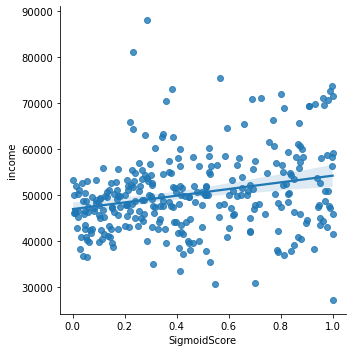

In [29]:
import seaborn as sns

corra = relation['SigmoidScore'].corr(relation['income'])
print(corra)

sns.lmplot(x="SigmoidScore", y="income", data=relation)


0.43426129880254283


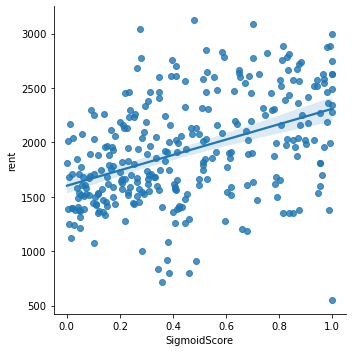

In [30]:
corrb = relation['SigmoidScore'].corr(relation['rent'])
print(corrb)

sns.lmplot(x="SigmoidScore", y="rent", data=relation)


#### Visualization

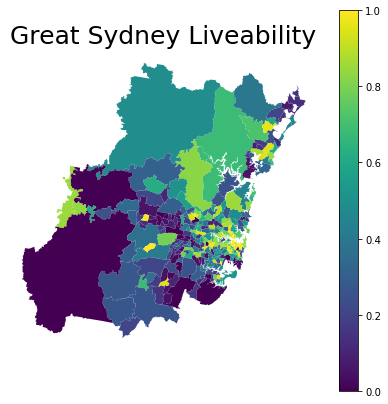

In [117]:
ax = GSLiveability.plot(column='SigmoidScore', figsize=(7, 7), legend=True)
ax.set_axis_off();
plt.title("Great Sydney Liveability", fontdict={'fontsize': 25});


In [118]:
# interactive map got inspired by https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html

GSLiveability.explore(
    column="SigmoidScore", # make choropleth based on "SigmoidScore" column
    tooltip="SA2_NAME16", # show Neighbourhood name (on hover)
    popup=True, # show all values (on click)
    cmap="viridis", # use "viridis" matplotlib colormap
)

### 3. Sydney Inner City Liveability Analysis

#### Z score

for only neighbourhoods in Sydney Inner ciTY

Playground z score

number of plagrounds contained by each area

In [119]:
q = """
with counts as (
select sa2_main16, count(p.geom) as num
from playgrounds p left join sa2 on ST_contains(sa2.geom, p.geom)
group by sa2_main16
having sa3_name16 = 'Sydney Inner City')

select sa2_main16 as area_id, (num - (select avg(num) from counts)) / (select stddev(num) from counts) as playground_zscore
from counts
;
"""
PlaygroundZScore = pd.read_sql_query(q, conn)
PlaygroundZScore


,area_id,playground_zscore
0,117031329,-1.183964
1,117031330,1.501315
2,117031331,1.135141
3,117031332,-0.695732
4,117031333,-0.817790
5,117031334,-0.817790
6,117031335,0.402792
7,117031336,0.402792
8,117031337,-0.939848
9,117031338,1.013083


Fountain z score

number of water fountains contained in each area 

In [120]:
q = """
with counts as (
select sa2_main16, count(f.geom) as num
from fountains f left join sa2 on ST_contains(sa2.geom, f.geom)
group by sa2_main16
having sa3_name16 = 'Sydney Inner City')

select sa2_main16 as area_id, (num - (select avg(num) from counts)) / (select stddev(num) from counts) as fountain_zscore
from counts
;
"""
FountainZScore = pd.read_sql_query(q, conn)
FountainZScore


,area_id,fountain_zscore
0,117031329,-1.215466
1,117031330,1.019874
2,117031331,0.810311
3,117031332,-0.167651
4,117031333,-0.656631
5,117031334,-0.656631
6,117031335,-0.656631
7,117031336,-0.796340
8,117031337,1.927981
9,117031338,0.391185


Swimmingpool z score

In [121]:
q = """
with counts as (
select sa2_main16, count(s.geom) as num
from sa2 left join swimmingpool s on ST_contains(sa2.geom, s.geom)
group by sa2_main16
having sa3_name16 = 'Sydney Inner City')

select sa2_main16 as area_id, (num - (select avg(num) from counts)) / (select stddev(num) from counts) as swimmingpool_zscore
from counts
;
"""
SwimmingpoolZScore = pd.read_sql_query(q, conn)
SwimmingpoolZScore


,area_id,swimmingpool_zscore
0,117031329,-0.948683
1,117031330,-0.948683
2,117031331,-0.948683
3,117031332,0.948683
4,117031333,0.948683
5,117031334,0.948683
6,117031335,-0.948683
7,117031336,0.948683
8,117031337,0.948683
9,117031338,-0.948683


Rent z score

In [122]:
InnerSydney = SA.loc[SA['SA3_NAME16'] == 'Sydney Inner City', 'SA2_MAIN16']
Rent = pd.merge(InnerSydney, neighbourhoods, how='left', left_on='SA2_MAIN16', right_on='area_id')
Rent['rent_zscore'] = ( Rent['rent'] - np.mean(Rent['rent']) ) / np.std(Rent['rent'])
RentZScore = Rent[['area_id','rent_zscore']]
RentZScore


,area_id,rent_zscore
0,117031329,0.308205
1,117031330,0.683050
2,117031331,-1.062059
3,117031332,-0.612246
4,117031333,-0.670555
5,117031334,0.658060
6,117031335,-0.932946
7,117031336,-0.312370
8,117031337,2.419829
9,117031338,-0.478968


#### Liveability Score

Score = S ( Zfood + Zhealth + Zplayground + Zfountain + Zswimmingpool − Zcrime - Zrent)

In [125]:
ScoreCity = pd.merge(SchoolZScore, BusZScore, how='outer', left_on='area_id', right_on='area_id')
ScoreCity = pd.merge(ScoreCity, CrimeZScore, how='outer', left_on='area_id', right_on='area_id')
ScoreCity = pd.merge(ScoreCity, FountainZScore, how='right', left_on='area_id', right_on='area_id' )
ScoreCity = pd.merge(ScoreCity, PlaygroundZScore, how='outer', left_on='area_id', right_on='area_id' )
ScoreCity = pd.merge(ScoreCity, SwimmingpoolZScore, how='outer', left_on='area_id', right_on='area_id' )
ScoreCity = pd.merge(ScoreCity, RentZScore, how='outer', left_on='area_id', right_on='area_id' )

ScoreCity['score'] = ScoreCity['food_zscore'] + ScoreCity['health_zscore'] + ScoreCity['playground_zscore'] + ScoreCity['fountain_zscore'] + ScoreCity['swimmingpool_zscore'] - ScoreCity['crime_zscore'] - ScoreCity['rent_zscore'] 
ScoreCity['SigmoidScore'] = sigmoid(ScoreCity['score'])
ScoreCity = ScoreCity[['area_id', 'area_name_x', 'SigmoidScore']]
ScoreCity.rename(columns={'area_name_x':'area_name'}, inplace=True)
ScoreCity


,area_id,area_name,SigmoidScore
0,117031329,Darlinghurst,0.975169
1,117031330,Erskineville - Alexandria,0.936044
2,117031331,Glebe - Forest Lodge,0.975685
3,117031332,Newtown - Camperdown - Darlington,0.977719
4,117031333,Potts Point - Woolloomooloo,0.898024
5,117031334,Pyrmont - Ultimo,0.760655
6,117031335,Redfern - Chippendale,0.661457
7,117031336,Surry Hills,0.996812
8,117031337,Sydney - Haymarket - The Rocks,1.000000
9,117031338,Waterloo - Beaconsfield,0.858333


#### Analysis

In [126]:
ScoreCity.nlargest(10, 'SigmoidScore')[['area_name','SigmoidScore']]


,area_name,SigmoidScore
8,Sydney - Haymarket - The Rocks,1.000000
7,Surry Hills,0.996812
3,Newtown - Camperdown - Darlington,0.977719
2,Glebe - Forest Lodge,0.975685
0,Darlinghurst,0.975169
1,Erskineville - Alexandria,0.936044
4,Potts Point - Woolloomooloo,0.898024
9,Waterloo - Beaconsfield,0.858333
5,Pyrmont - Ultimo,0.760655
6,Redfern - Chippendale,0.661457


#### Visualization

In [127]:
CityS = SA.loc[SA['SA3_NAME16'] == 'Sydney Inner City']
CityLiveability = pd.merge(CityS, Score, how='left', left_on='SA2_MAIN16', right_on='area_id')
CityLiveability = CityLiveability[['SA2_MAIN16', 'SA2_NAME16', 'SigmoidScore', 'geometry']]


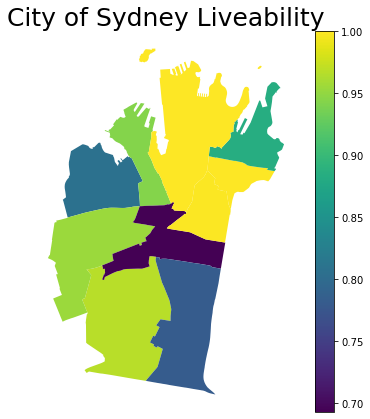

In [128]:
ax = CityLiveability.plot(column='SigmoidScore', figsize=(7, 7), legend=True)
ax.set_axis_off();
plt.title("City of Sydney Liveability", fontdict={'fontsize': 25});


In [129]:
# https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html

import folium

m = CityLiveability.explore(
    column="SigmoidScore", # make choropleth based on "SigmoidScore" column
    tooltip="SA2_NAME16", # show Neighbourhood name (on hover)
    popup=True, # show all values in popup (on click)
    cmap="viridis", # use "viridis" matplotlib colormap
)

url = 'https://services1.arcgis.com/cNVyNtjGVZybOQWZ/arcgis/rest/services/SwimmingPools/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson'
swim = gpd.read_file(url)
swim.explore(
    m=m,
    color="red",
    tooltip="Name", # show Swimmingpool name (on hover)
    name="Swimmingpool" # name of the layer in the map
)

folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m  # show map

### Close

In [130]:
conn.close()
db.dispose()